In [43]:
from google.colab import files 
files.upload()
##uploading five celebrities dataset to commence the analysis we import the data along with the pretrained facenet model for face embedding 

Saving celebrity-newtest.zip to celebrity-newtest.zip


{'celebrity-newtest.zip': b'PK\x03\x04\x14\x00\x08\x08\x08\x00\x0bO5O\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00H\x00celebrity/ben_afflek/httpwwwallposterscomimagesPostersPFjpg.jpgupD\x00\x01x\x0c\xed\xfecelebrity/ben_afflek/httpwwwallposterscomimagesPostersPFjpg.jpg\x01\xb1<N\xc3\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x02\x00\x00d\x00d\x00\x00\xff\xfe\x00\x12Adobe ImageReady\xff\xec\x00\x11Ducky\x00\x01\x00\x04\x00\x00\x00<\x00\x00\xff\xee\x00\x0eAdobe\x00d\xc0\x00\x00\x00\x01\xff\xdb\x00\x84\x00\x06\x04\x04\x04\x05\x04\x06\x05\x05\x06\t\x06\x05\x06\t\x0b\x08\x06\x06\x08\x0b\x0c\n\n\x0b\n\n\x0c\x10\x0c\x0c\x0c\x0c\x0c\x0c\x10\x0c\x0e\x0f\x10\x0f\x0e\x0c\x13\x13\x14\x14\x13\x13\x1c\x1b\x1b\x1b\x1c\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x01\x07\x07\x07\r\x0c\r\x18\x10\x10\x18\x1a\x15\x11\x15\x1a\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1f\x1

In [162]:
! pip install mtcnn
import numpy as np
import seaborn as sns
import pandas as pd
from matplotlib import pyplot

from PIL import Image
from numpy import asarray
from mtcnn.mtcnn import MTCNN
from os import listdir

from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed
from numpy import asarray


from numpy import load
from keras.models import load_model
from numpy import expand_dims



from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from sklearn import discriminant_analysis

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

from xgboost import XGBClassifier


In [5]:
###Developing Face Classification System
#Using the MTCNN model for face detection
#using the facenet model for face embedding 
#then use a linear support vector classification for identifying the image (We will experiment with other types of data as well)
#using the 5 celebrities dataset
! unzip fivecelebritiesdataset.zip

Archive:  fivecelebritiesdataset.zip
  inflating: data/train/ben_afflek/httpcsvkmeuaeccjpg.jpg  
  inflating: data/train/ben_afflek/httpimagesfandangocomrImageRendererredesignstaticimgnoxportraitjpgpcpcpcimagesmasterrepositoryperformerimagespjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdbbdbbbececacdecdcdfjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdfdfadcfeabjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxedaedabcbefbcbabbjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeebdfdbaaajpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeeedcacddeccccacfjpg.jpg  
  inflating: data/train/ben_afflek/httpsuploadwikimediaorgwikipediacommonsthumbddBenAffleckbyGageSkidmorejpgpxBenAffleckbyGageSkidmorejpg.jpg  
  inflating: data/train/ben_afflek/httptrwebimgacstanetcxbdddmediasnmediajpg.jpg  
  inflating: data/train/ben_afflek/httpwwwaceshowbizcomimagesphotobenaffleckjpg.j

In [163]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
	
	image = Image.open(filename)# load image from file
	
	image = image.convert('RGB')# convert to RGB, if needed
	
	pixels = asarray(image) # convert to array
	
	detector = MTCNN() # create the detector, using default weights
	
	results = detector.detect_faces(pixels)# detect faces in the image
	 
	x1, y1, width, height = results[0]['box']# extract the bounding box
	
	x1, y1 = abs(x1), abs(y1)
	x2, y2 = x1 + width, y1 + height
	# extract the face
	face = pixels[y1:y2, x1:x2]
	# resize pixels to the model size
	image = Image.fromarray(face)
	image = image.resize(required_size)
	face_array = asarray(image)
	return face_array

In [164]:
def storeface(directory):
	Cface = list()
	# enumerate files
	for filename in listdir(directory):
		# path
		path = directory + filename
		# get face
		face = extract_face(path)
		Cface.append(face)
	return Cface 

In [165]:
# function meant to capture images stored in each subdirectory and collating all of them into a dataset 
def load_dataset(directory):
	pic, name = list(), list()
	for subdir in listdir(directory):
		path = directory + subdir + '/'
		if not isdir(path):
			continue
		faces = load_faces(path)
		labels = [subdir for _ in range(len(faces))]
		# store
		pic.extend(faces)
		name.extend(labels)
	return asarray(pic), asarray(name)

In [166]:
# load train dataset
trainX, trainY = load_dataset('data/train/')
print(trainX.shape, trainY.shape)
# load test dataset
testX, testY = load_dataset('data/val/')
print(testX.shape, testy.shape)
# save arrays to one file in compressed format
savez_compressed('5-celebrity.npz', trainX, trainY, testX, testY)

(93, 160, 160, 3) (93,)
(25, 160, 160, 3) (25, 1)


In [ ]:
##Creating the face embeddings 

In [168]:
data = load('5-celebrity.npz')
trainX, trainY, testX, testY = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']

In [169]:
modelf = load_model('facenet_keras.h5')

In [170]:
def feature_emb(model, pixels):
	pixels = pixels.astype('float32')
	# standardize pixel values across channels (global)
	mean, std = pixels.mean(), pixels.std()
	pixels = (pixels - mean) / std
	# transform face into one sample
	samples = expand_dims(pixels, axis=0)
	# make prediction to get embedding
	yhat = model.predict(samples)
	return yhat[0]

In [171]:
# convert each face in the train set to an embedding
newTrainX = list()
for pixels in trainX:
	embedding = feature_emb(modelf, pixels)
	newTrainX.append(embedding)
newTrainX = asarray(newTrainX)
print(newTrainX.shape)

(93, 128)


In [173]:
# convert each face in the test set to an embedding
newTestX = list()
for face_pixels in testX:
	embedding = feature_emb(modelf, face_pixels)
	newTestX.append(embedding)
newTestX = asarray(newTestX)
print(newTestX.shape)

(25, 128)


In [174]:
savez_compressed('embeddings.npz', newTrainX, trainY, newTestX, testY)

In [175]:
###Face Classification 
data = load('embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Dataset: train=%d, test=%d' % (trainX.shape[0], testX.shape[0]))

Dataset: train=93, test=25


In [176]:
# load faces
data = load('5-celebrity.npz')
testX_faces = data['arr_2']
# load face embeddings
data = load('embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']

In [177]:
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)

In [178]:
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)

#Algorithms

Predicting with a linear discriminant analysis

In [179]:
lda = discriminant_analysis.LinearDiscriminantAnalysis( solver = 'svd', shrinkage = None, priors = None, n_components = None, store_covariance = False, tol = 0.0001 )
lda.fit(trainX, trainy)

LinearDiscriminantAnalysis()

Predicted: jerry_seinfeld (100.000)
Expected: jerry_seinfeld


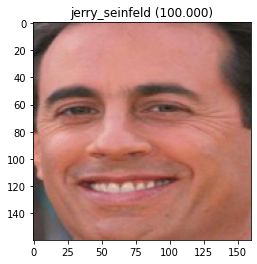

In [180]:
# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])
# prediction for the face
samples = expand_dims(random_face_emb, axis=0)
yhat_class = lda.predict(samples)
yhat_prob = lda.predict_proba(samples)
# get name
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])
# plot for fun
pyplot.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
pyplot.title(title)
pyplot.show()

In [181]:
##confusion matrix

yhat_class = lda.predict(testX)
Nmy= out_encoder.inverse_transform(yhat_class)
labels = np.unique(Nmy)


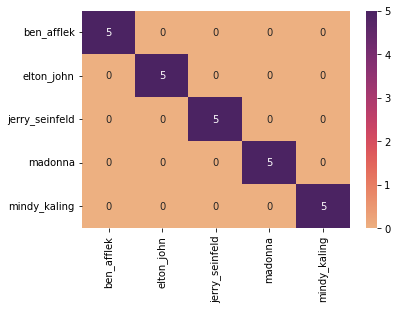

In [182]:

from sklearn.metrics import confusion_matrix
m = confusion_matrix(yhat_class,testy)
m =pd.DataFrame(m,index =labels,columns= labels)
sns.heatmap(m, cmap= "flare" , annot = True)

### Using XGBOOST

In [183]:
from xgboost import XGBClassifier
XGB = XGBClassifier()
XGB.fit(trainX, trainy)

XGBClassifier(objective='multi:softprob')

Predicted: ben_afflek (96.691)
Expected: ben_afflek


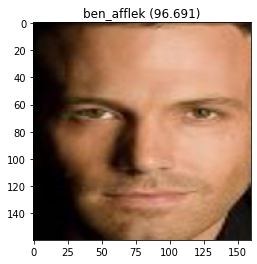

In [184]:
# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])
# prediction for the face
samples = expand_dims(random_face_emb, axis=0)
yhat_class = XGB.predict(samples)
yhat_prob = XGB.predict_proba(samples)
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])
pyplot.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
pyplot.title(title)
pyplot.show()

In [185]:
##confusion matrix
import numpy as np
yhat_class = XGB.predict(testX)
Nmy= out_encoder.inverse_transform(yhat_class)
labels = np.unique(Nmy)


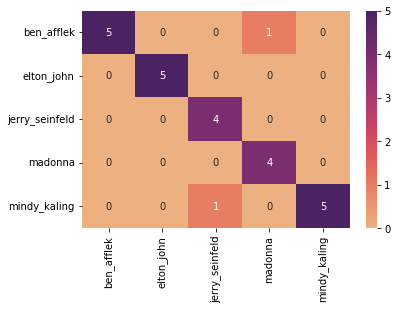

In [186]:
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix
m = confusion_matrix(yhat_class,testy)
m =pd.DataFrame(m,index =labels,columns= labels)
sns.heatmap(m, cmap= "flare" , annot = True)

###Random Forest

In [187]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
rf = RandomForestClassifier(n_estimators=100,random_state = 0) 
parameters = {
    "max_depth":range(1,15),
    "min_samples_leaf":range(1,20)}
rf_opti = GridSearchCV(rf,parameters,cv=5,scoring='accuracy')
rf_opti.fit(trainX, trainy)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': range(1, 15),
                         'min_samples_leaf': range(1, 20)},
             scoring='accuracy')

Predicted: elton_john (43.686)
Expected: elton_john


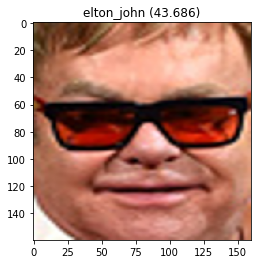

In [188]:
# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])
# prediction for the face
samples = expand_dims(random_face_emb, axis=0)
yhat_class = rf_opti.predict(samples)
yhat_prob = rf_opti.predict_proba(samples)
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])
pyplot.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
pyplot.title(title)
pyplot.show()

In [189]:
##confusion matrix

yhat_class = gbmOpt.predict(testX)
Nmy= out_encoder.inverse_transform(yhat_class)
labels = np.unique(Nmy)


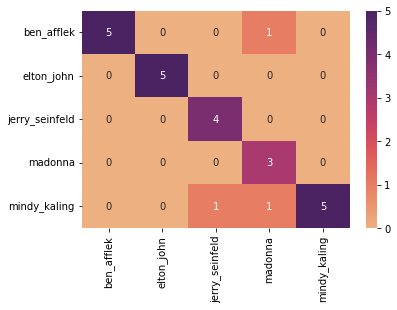

In [190]:

from sklearn.metrics import confusion_matrix
m = confusion_matrix(yhat_class,testy)
m =pd.DataFrame(m,index =labels,columns= labels)
sns.heatmap(m, cmap= "flare" , annot = True)

##Gradient Boosting

In [191]:
from sklearn.ensemble import GradientBoostingClassifier
# Optimization of two parameters
paramGrid = [
  {'n_estimators': list(range(100,601,50)), 'learning_rate': [0.1,0.2,0.3,0.4]}
 ]
gbmC= GridSearchCV(GradientBoostingClassifier(),paramGrid,cv=5,n_jobs=-1)
gbmOpt=gbmC.fit(trainX, trainy)

Predicted: madonna (100.000)
Expected: madonna


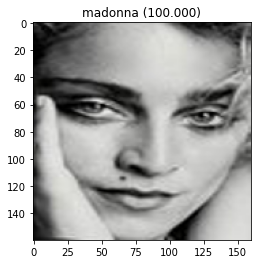

In [192]:
# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])
# prediction for the face
samples = expand_dims(random_face_emb, axis=0)
yhat_class = gbmOpt.predict(samples)
yhat_prob = gbmOpt.predict_proba(samples)
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])
pyplot.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
pyplot.title(title)
pyplot.show()

In [193]:
##confusion matrix

yhat_class = gbmOpt.predict(testX)
Nmy= out_encoder.inverse_transform(yhat_class)
labels = np.unique(Nmy)


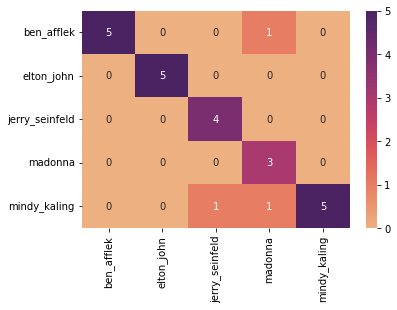

In [194]:

m = confusion_matrix(yhat_class,testy)
m =pd.DataFrame(m,index =labels,columns= labels)
sns.heatmap(m, cmap= "flare" , annot = True)

# Face recognition using eigenfaces method

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Load the data pictures with index of each picture as label :

In [ ]:
pictures = np.load('olivetti_faces.npy')
labels = np.load('olivetti_faces_target.npy')

Picture of each individual from the dataset :

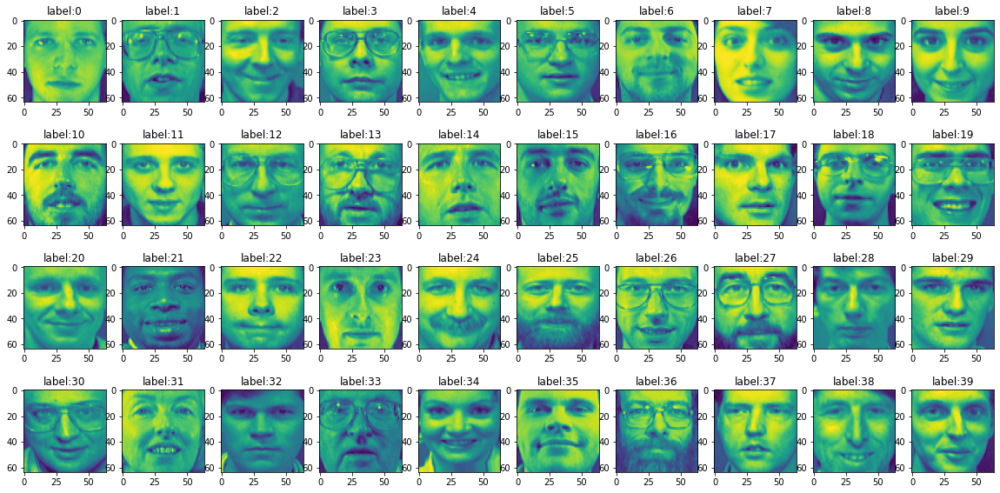

In [ ]:
fig, axis = plt.subplots(nrows=4, ncols=10, figsize=(20, 10))
axis = axis.flatten()
for index in np.unique(labels):
    pic=index*10
    axis[index].imshow(pictures[pic])
    axis[index].set_title("label:{}".format(index))

Convert images to vectors :

In [ ]:
X = pictures.reshape((pictures.shape[0],pictures.shape[1]*pictures.shape[2]))

In [ ]:
X.shape

(400, 4096)

Since we have 10 pictures of 40 individuals the shape of X is 400.

Let's try to apply some algorithms to predict the label of the pictures, the methods used are :

- LDA
- Logistic Regression
- Decision Tree Classification
- Support Vector Machine


In [ ]:
# Upload the required packages

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

### PCA implementation :

In [ ]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

Finding the optimal number of dimensions :

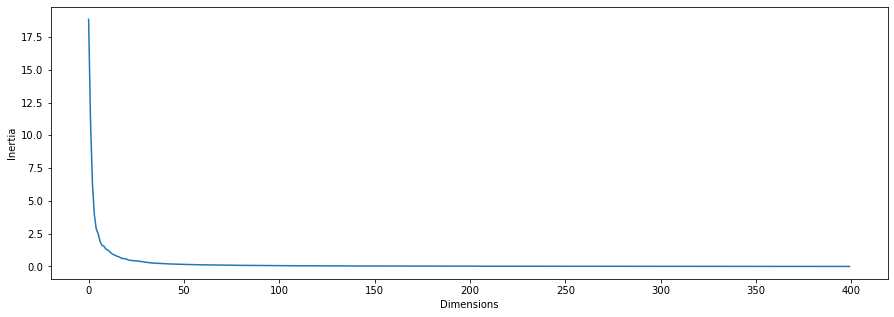

In [ ]:
res = PCA()
res.fit(X)
plt.figure(1, figsize=(15,5))
plt.plot(res.explained_variance_)
plt.xlabel('Dimensions')
plt.ylabel('Inertia')
plt.show()

We observe that the optimal number of components is approximately 50.

In [ ]:
# Set the number of components we keep
comp = 50

In [ ]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, labels, test_size=0.25, stratify=labels)

In [ ]:
res = PCA(n_components=comp)
res.fit(Xtrain)

PCA(n_components=50)

Now let's visualize the pictures on which we performed PCA, meaning the eigenfaces :

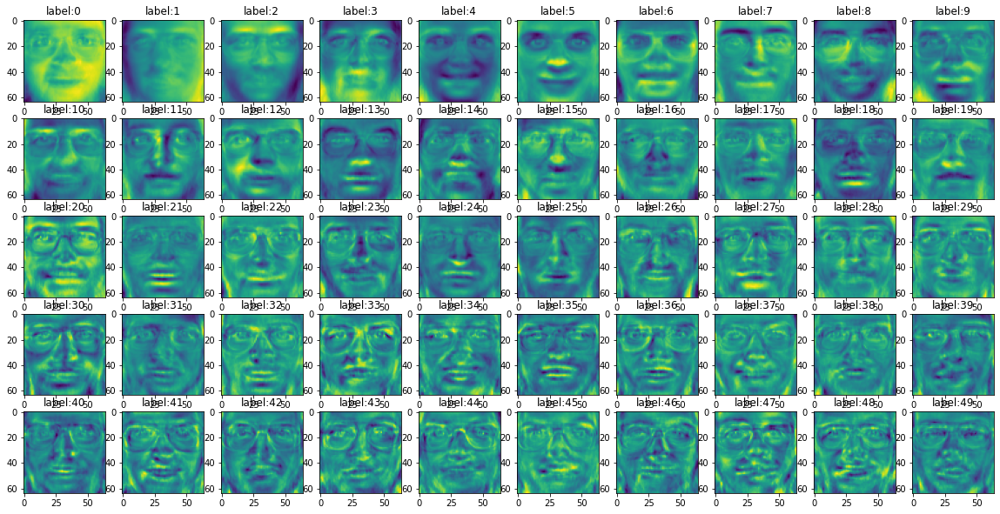

In [ ]:
n = len(res.components_)
pca_pictures = res.components_.reshape((n, pictures.shape[1], pictures.shape[2]))
faces = int(n/10)
fig, axis = plt.subplots(nrows = faces, ncols = 10, figsize = (20, 10))
axis = axis.flatten()
for i in range(n):
    axis[i].imshow(pca_pictures[i])
    axis[i].set_title("label:{}".format(i))

In [ ]:
Xtrainres = res.transform(Xtrain)
Xtestres = res.transform(Xtest)

In [ ]:
algorithms = [('LDA', LinearDiscriminantAnalysis()), ("LR",LogisticRegression()), ("DT",DecisionTreeClassifier()), ("SVM",SVC())]

In [ ]:
for algo, model in algorithms:
    
    mod = model
    mod.fit(Xtrainres, Ytrain)
    Ypred = mod.predict(Xtestres)
    
    s = 0
    for i in range(len(Ypred)):
        if Ypred[i] == Ytest[i]:
            s +=1
            
    print("{} Result".format(algo), ":", s/len(Ypred))

LDA Result : 0.73


C:\Users\ryiad\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LR Result : 0.98
DT Result : 0.45
SVM Result : 0.94


Linear regression and Support Vector Machine seems to give very good results.

Let's try the method on the other dataset :

In [ ]:
from os import listdir
from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed
from numpy import asarray
from PIL import Image
from numpy import asarray
from mtcnn.mtcnn import MTCNN

In [ ]:
def extract_face(filename, required_size=(160, 160)):
    # load image from file
    image = Image.open(filename)
    # convert to RGB, if needed
    image = image.convert('RGB')
    # convert to array
    pixels = asarray(image)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    # extract the face
    face = pixels[y1:y2, x1:x2]
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = asarray(image)
    return face_array

In [ ]:
def load_faces(directory):
    faces = list()
    # enumerate files
    for filename in listdir(directory):
        # path
        path = directory + filename
        # get face
        face = extract_face(path)
        # store
        faces.append(face)
    return faces 

In [ ]:
# load a dataset that contains one subdir for each class that in turn contains images
def load_dataset(directory):
    X, y = list(), list()
    # enumerate folders, on per class
    for subdir in listdir(directory):
        # path
        path = directory + subdir + '/'
        # skip any files that might be in the dir
        if not isdir(path):
            continue
        # load all faces in the subdirectory
        faces = load_faces(path)
        # create labels
        labels = [subdir for _ in range(len(faces))]
            # summarize progress
        print('>loaded %d examples for class: %s' % (len(faces), subdir))
        # store
        X.extend(faces)
        y.extend(labels)
    return asarray(X), asarray(y)

In [ ]:
# load train dataset
trainX, trainy = load_dataset('C:\\Users\\ryiad\\Desktop\\mlhomewrok\\fivecelebritiesdataset\\data\\train\\')
print(trainX.shape, trainy.shape)
# load test dataset
testX, testy = load_dataset('C:\\Users\\ryiad\\Desktop\\mlhomewrok\\fivecelebritiesdataset\\data\\val\\')
print(testX.shape, testy.shape)

>loaded 14 examples for class: ben_afflek
>loaded 17 examples for class: elton_john
>loaded 21 examples for class: jerry_seinfeld
>loaded 19 examples for class: madonna
>loaded 22 examples for class: mindy_kaling
(93, 160, 160, 3) (93,)
>loaded 5 examples for class: ben_afflek
>loaded 5 examples for class: elton_john
>loaded 5 examples for class: jerry_seinfeld
>loaded 5 examples for class: madonna
>loaded 5 examples for class: mindy_kaling
(25, 160, 160, 3) (25,)


In [ ]:
trainy.shape

(93,)

In [ ]:
trainX = trainX.reshape((len(trainX), 3*160*160))
testX = testX.reshape((len(testX), 3*160*160))

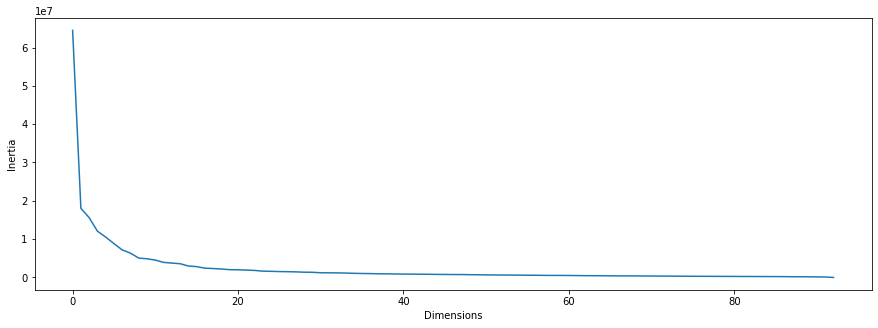

In [ ]:
res = PCA()
res.fit(trainX)
plt.figure(1, figsize=(15,5))
plt.plot(res.explained_variance_)
plt.xlabel('Dimensions')
plt.ylabel('Inertia')
plt.show()

In [ ]:
res = PCA(n_components=20)
res.fit(trainX)

PCA(n_components=20)

In [ ]:
Xtrainres = res.transform(trainX)
Xtestres = res.transform(testX)

In [ ]:
for algo, model in algorithms:
    
    mod = model
    mod.fit(Xtrainres, trainy)
    Ypred = mod.predict(Xtestres)
    
    s = 0
    for i in range(len(Ypred)):
        if Ypred[i] == testy[i]:
            s +=1
            
    print("{} Result".format(algo), ":", s/len(Ypred))

LDA Result : 0.88
LR Result : 0.72
DT Result : 0.44
SVM Result : 0.84


C:\Users\ryiad\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
